## Libraries

In [154]:
import Performance_Spectrum
import datetime
import pandas as pd 
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore')
from neo4j import GraphDatabase
from pm4py.objects.log.log import EventLog
from collections import Counter
import pm4py

## FIFO verification

### Connect to Neo4J database

In [155]:
driver = GraphDatabase.driver("bolt://localhost:7687", auth=("Username", "Password"))
session = driver.session()

### Get cases from the graph database

In [156]:
query = f'''match (r:Run)
where (:Event {{Activity:"Carga L+D iniciada"}}) - [:CORR] -> (r)
and (:Event {{Activity:"Carga L+D liberada"}}) - [:CORR] -> (r)
and (:Event {{Activity:"Montaje"}}) - [:CORR] -> (r)
and (:Event {{Activity:"Producción montada"}}) - [:CORR] -> (r)
and (:Event {{Activity:"Composición de cargas"}}) - [:CORR] -> (r)
and (:Event {{Activity:"Carga de esterilizador liberada"}}) - [:CORR] -> (r)
with r
match (e:Event) - [:CORR] -> (r)
return e.CaseID, e.Activity, e.Nombre, e.KitID, e.Usuario as resource, e.timestamp, e.`Código`, e.NS 
'''
result = session.run(query)
records = [record.values() for record in result]
columns = result.keys()
df = pd.DataFrame(records, columns=columns)
df['e.timestamp'] = pd.to_datetime(df['e.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df.head()

,e.CaseID,e.Activity,e.Nombre,e.KitID,resource,e.timestamp,e.`Código`,e.NS
0,EQP-QUI.ORL.OPT-14-CN35128,Carga L+D liberada,HOPKINS 0º 4mm 18cm,EQP-QUI.ORL.OPT-14,MCE,2022-03-31 12:04:00+00:00,EQP-QUI.ORL.OPT,14
1,EQP-QUI.ORL.OPT-14-CN35128,Carga L+D iniciada,HOPKINS 0º 4mm 18cm,EQP-QUI.ORL.OPT-14,BM,2022-03-31 11:02:00+00:00,EQP-QUI.ORL.OPT,14
2,EQP-QUI.ORL.OPT-14-CN35128,Composición de cargas,HOPKINS 0º 4mm 18cm,EQP-QUI.ORL.OPT-14,EH,2022-03-31 12:41:00+00:00,EQP-QUI.ORL.OPT,14
3,EQP-QUI.ORL.OPT-14-CN35128,Montaje,HOPKINS 0º 4mm 18cm,EQP-QUI.ORL.OPT-14,PN,2022-03-31 12:19:00+00:00,EQP-QUI.ORL.OPT,14
4,EQP-QUI.ORL.OPT-14-CN35128,Producción montada,HOPKINS 0º 4mm 18cm,EQP-QUI.ORL.OPT-14,PN,2022-03-31 12:20:00+00:00,EQP-QUI.ORL.OPT,14


### Transfer graph data into event log

In [157]:
event_log = pm4py.format_dataframe(df, case_id='e.CaseID', activity_key='e.Activity', timestamp_key='e.timestamp')


In [158]:
event_log = pm4py.convert_to_event_log(event_log)
# Calculate trace frequencies
trace_frequency = Counter()
for trace in event_log:
    for event in trace:
        event['lifecycle:transition'] = 'complete'
        event['org:resource'] = event['resource']
        del event['resource']
    trace_id = tuple(event["concept:name"] for event in trace)
    trace_frequency[trace_id] += 1

In [159]:
# Define the minimum frequency threshold
min_frequency = 10  # Change this value to your desired minimum frequency

# Filter traces based on frequency
filtered_event_log = EventLog()
for trace in event_log:
    trace_id = tuple(event["concept:name"] for event in trace)
    if trace_frequency[trace_id] >= min_frequency:
        filtered_event_log.append(trace)

In [160]:
rf = Performance_Spectrum.EventLog(name='company_data', eventlog=filtered_event_log)

> Cleaning time zone information, adjust to 0.
> Found dates in event log ranging from 2022-01-01 07:21:00 to 2022-03-31 21:38:00.
> Done, continue with load_frame.


### Set up the dataframe for the Performance Spectrum

In [161]:
# transform event data into dataframe, set maxdate=... to include only event up to maxdate, takes some time
rf.load_frame(maxdate=datetime.datetime(2022, 3, 31, 23, 59), mindate =datetime.datetime(2022, 3, 1, 0, 1))

> Creating Pandas DataFrame from event log, this might take a while...
> Done, continue with inspection of pf and create_structure


In [162]:
# transforms individual events in the dataframe (A,time1),(B,time2) into segment observations (A:B, [time1,time2])
rf.create_structure()
# clean out meta data to reduce size of dataframe
rf.remove_meta()

> Shifting log to generate case transitions.
> Adjusting time-grain to seconds.
> Done, continue with remove_meta to remove columns from pf and to correct naming.


In [163]:
# Save our Event Log to disc using set name (here 'company_data')
rf.save()

In [164]:
# Load our Event Log object again (much faster than rebuilding)
rf = Performance_Spectrum.load_log('company_data')

In [165]:
rf.pf.head()

,case_id,start_org:resource,end_org:resource,start_time,end_time,segment_name,duration,segment_index
0,0.0,LI,MR,1422.0,1422.0,Entrada Material Sucio complete - Cargado en c...,0.0,0
1,0.0,MR,CM,1422.0,1423.0,Cargado en carro L+D complete - Carga L+D inic...,1.0,1
2,0.0,CM,SP,1423.0,1424.0,Carga L+D iniciada complete - Carga L+D libera...,1.0,2
22,1.0,SM,SM,1590.0,1590.0,Entrada Material Sucio complete - Entrada Mate...,0.0,3
23,1.0,SM,SM,1590.0,1590.0,Entrada Material Sucio complete - Entrada Mate...,0.0,3


In [166]:
rf.pf.iloc[-1]

case_id                                                          5789.0
start_org:resource                                                   PN
end_org:resource                                                     SP
start_time                                                       1593.0
end_time                                                         1595.0
segment_name          Composición de cargas complete - Carga de este...
duration                                                            2.0
segment_index                                                        13
Name: 43600, dtype: object

### Visualize Performance Spectrum Dataframe

In [167]:
# get statistics of total observations per segment, for all segments, sort by frequency
rf.segment_counts()

{'Montaje complete - Producción montada complete': 5405,
 'Producción montada complete - Composición de cargas complete': 5363,
 'Composición de cargas complete - Carga de esterilizador liberada complete': 5316,
 'Cargado en carro L+D complete - Carga L+D iniciada complete': 4088,
 'Carga L+D iniciada complete - Carga L+D liberada complete': 4081,
 'Entrada Material Sucio complete - Cargado en carro L+D complete': 3807,
 'Carga L+D liberada complete - Montaje complete': 3718,
 'Cargado en carro L+D complete - Cargado en carro L+D complete': 961,
 'Carga L+D iniciada complete - Carga L+D iniciada complete': 944,
 'Carga L+D liberada complete - Carga L+D liberada complete': 881,
 'Entrada Material Sucio complete - Entrada Material Sucio complete': 772,
 'Composición de cargas complete - Composición de cargas complete': 588,
 'Carga de esterilizador liberada complete - Carga de esterilizador liberada complete': 546,
 'Producción montada complete - Producción montada complete': 521,
 'Carg

In [168]:
# use the build in filter function to select segments
segments = rf.filter_segments(compare_to='max', cutoff=0.1)
segments

['Montaje complete - Producción montada complete',
 'Producción montada complete - Composición de cargas complete',
 'Composición de cargas complete - Carga de esterilizador liberada complete',
 'Cargado en carro L+D complete - Carga L+D iniciada complete',
 'Carga L+D iniciada complete - Carga L+D liberada complete',
 'Entrada Material Sucio complete - Cargado en carro L+D complete',
 'Carga L+D liberada complete - Montaje complete',
 'Cargado en carro L+D complete - Cargado en carro L+D complete',
 'Carga L+D iniciada complete - Carga L+D iniciada complete',
 'Carga L+D liberada complete - Carga L+D liberada complete',
 'Entrada Material Sucio complete - Entrada Material Sucio complete',
 'Composición de cargas complete - Composición de cargas complete',
 'Carga de esterilizador liberada complete - Carga de esterilizador liberada complete']

In [169]:
# get the 6 most frequent segments
segments = list(rf.segment_counts().keys())[:6]
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments, rf.pf)

### Visualization possibilities
#### 1- using one color

> No classifier defined, vis_mask=False so no coloring based on mask, coloring eveything in first color!


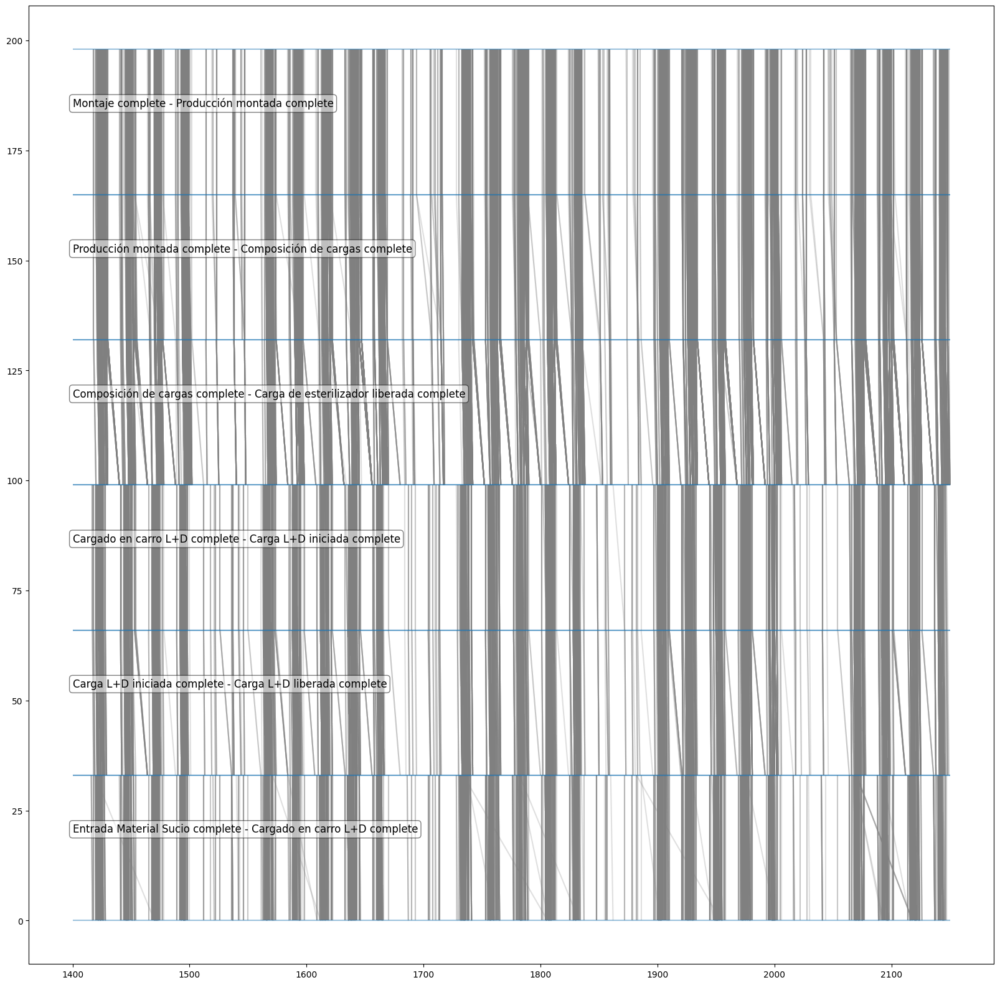

In [170]:
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(0.5,0.5,0.5)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=1400)

#### 2- Black and white

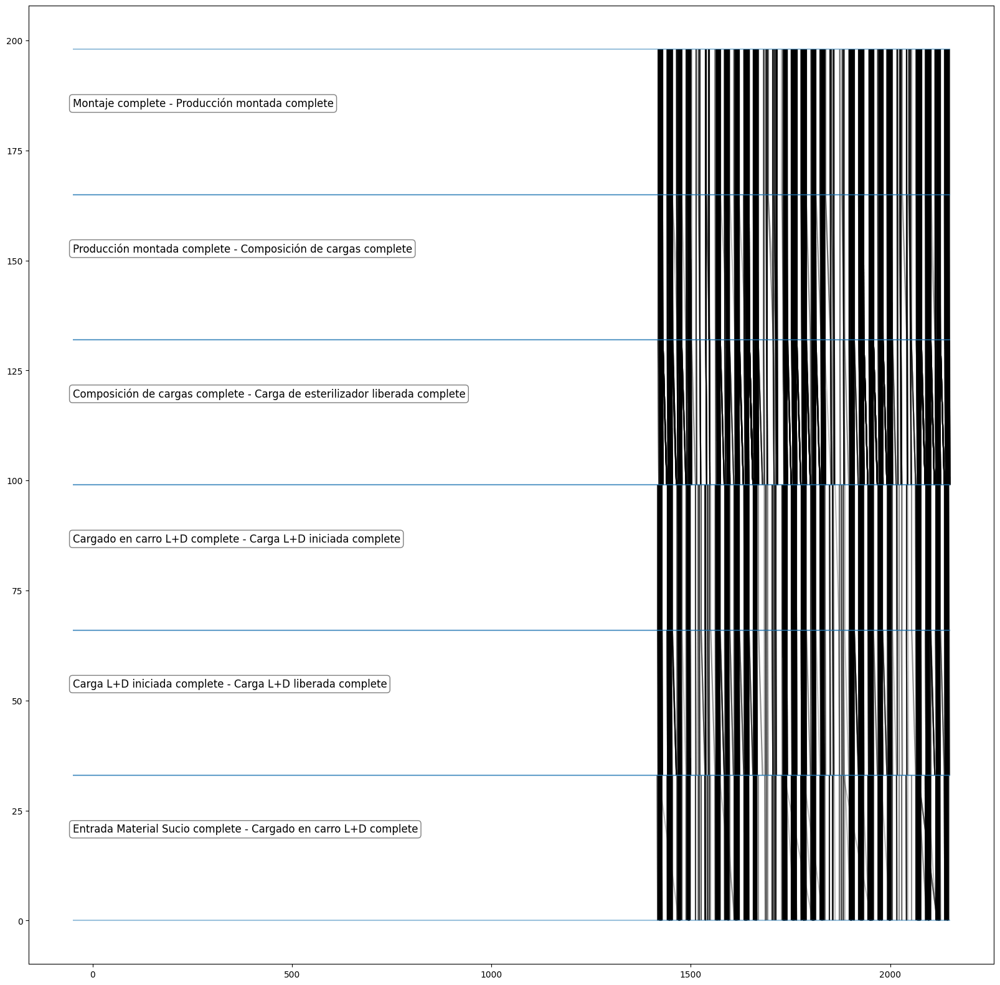

In [171]:
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(0,0,0),(1,0,0)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is the provided mask, False gives first color (black) True gives second color (red)
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, mask=vis_rf.pf['start_time'] > 10000, vis_mask=True)

#### 3- OG Performance Spectrum coloring based on classifier=hist

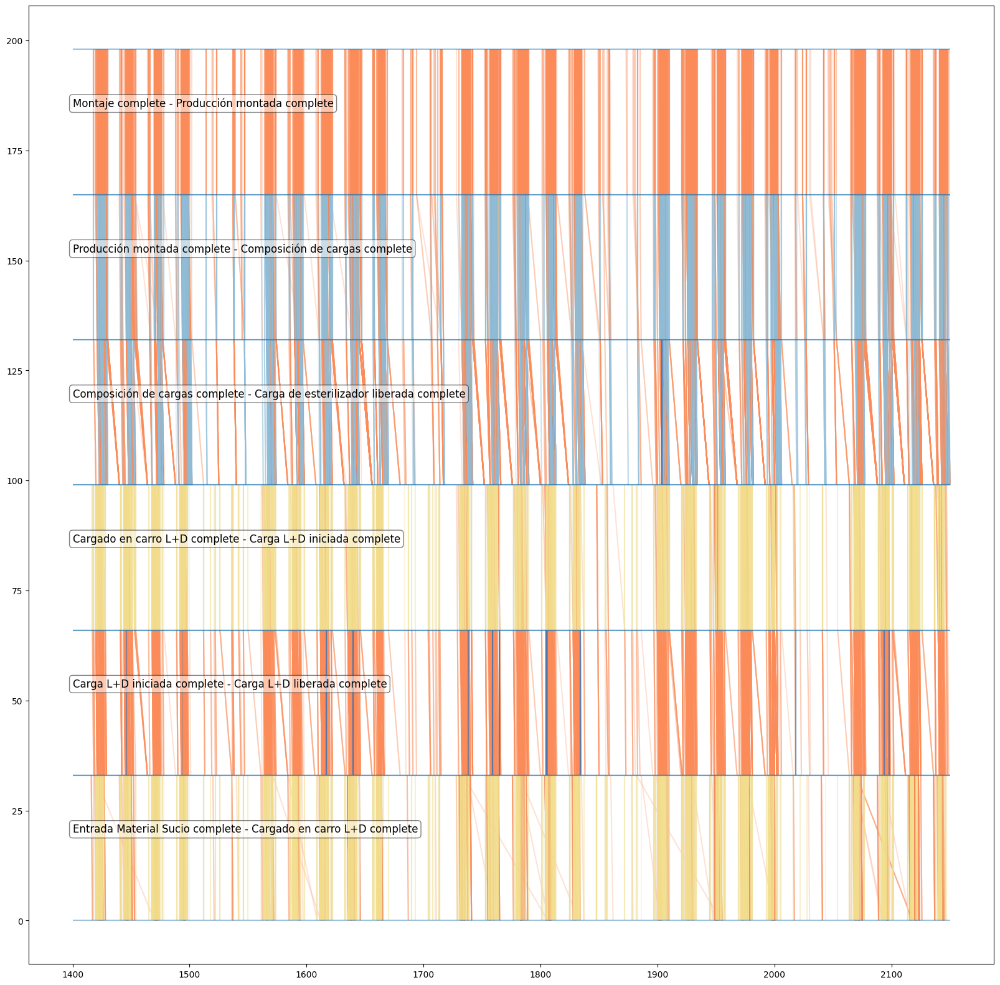

In [172]:
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance (4) quantiles color by `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=1400, classifier=vis_rf.classify_hist, metric='duration', args=[4])

#### 4- Visualize a certain classes (0 and 1 in this example)

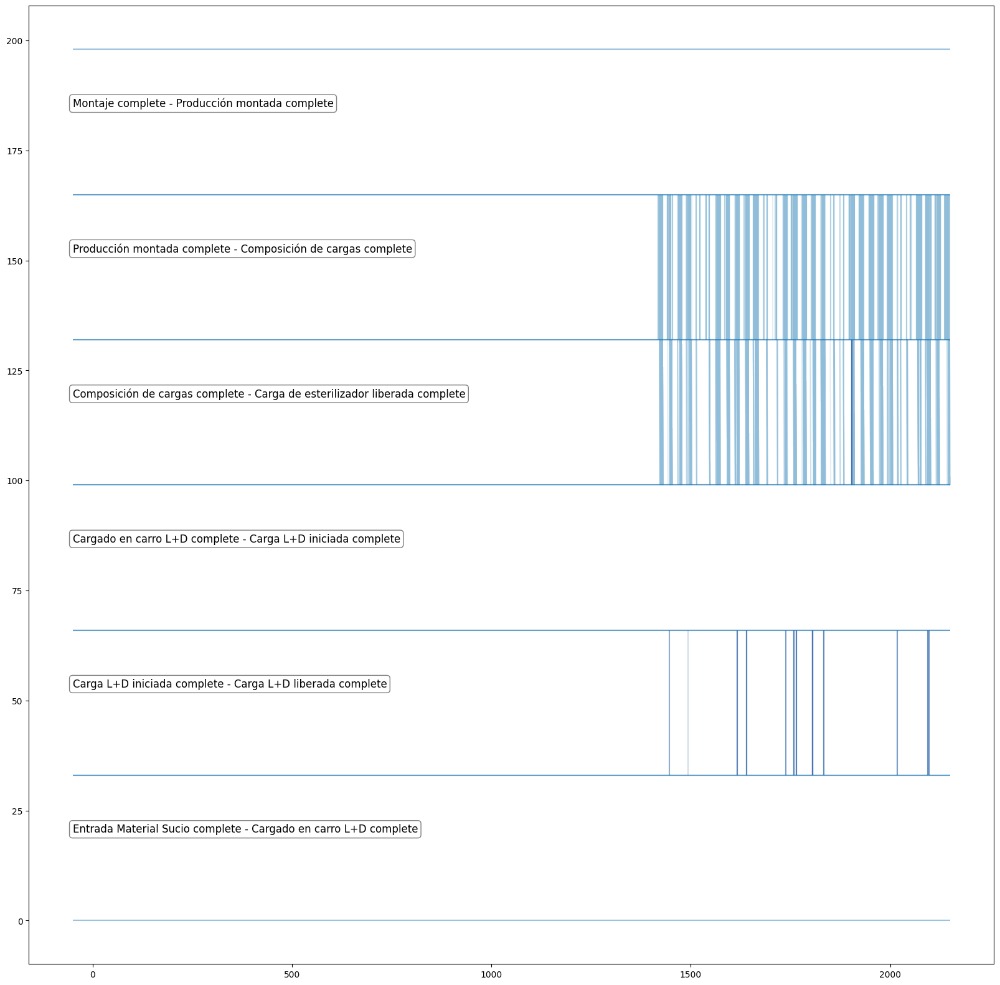

In [173]:
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance (4) quantiles color by `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, show_classes=[0,1], metric='duration', args=[4])

### Visualize our data
#### Use Dataframe Masks to Filter Events Before Computing Segments

In [174]:
# reload our event data (we keep more metadata this time)
rf.load_frame(maxdate=datetime.datetime(2023, 4, 1, 0, 0))
rf.create_structure()
# each segment has 2 activities, we can keep the meta data of both the start and end activity for a specific column like this:
rf.remove_meta()

> Creating Pandas DataFrame from event log, this might take a while...
> Done, continue with inspection of pf and create_structure
> Shifting log to generate case transitions.
> Adjusting time-grain to seconds.
> Done, continue with remove_meta to remove columns from pf and to correct naming.


In [175]:
rf.pf.head()

,case_id,start_org:resource,end_org:resource,start_time,end_time,segment_name,duration,segment_index
0,0.0,LI,LI,894.0,894.0,Entrada Material Sucio complete - Cargado en c...,0.0,0
1,0.0,LI,LI,894.0,895.0,Cargado en carro L+D complete - Carga L+D inic...,1.0,1
2,0.0,LI,SM,895.0,896.0,Carga L+D iniciada complete - Carga L+D libera...,1.0,2
4,1.0,LI,LI,942.0,942.0,Entrada Material Sucio complete - Cargado en c...,0.0,0
5,1.0,LI,CM,942.0,942.0,Cargado en carro L+D complete - Carga L+D inic...,0.0,1


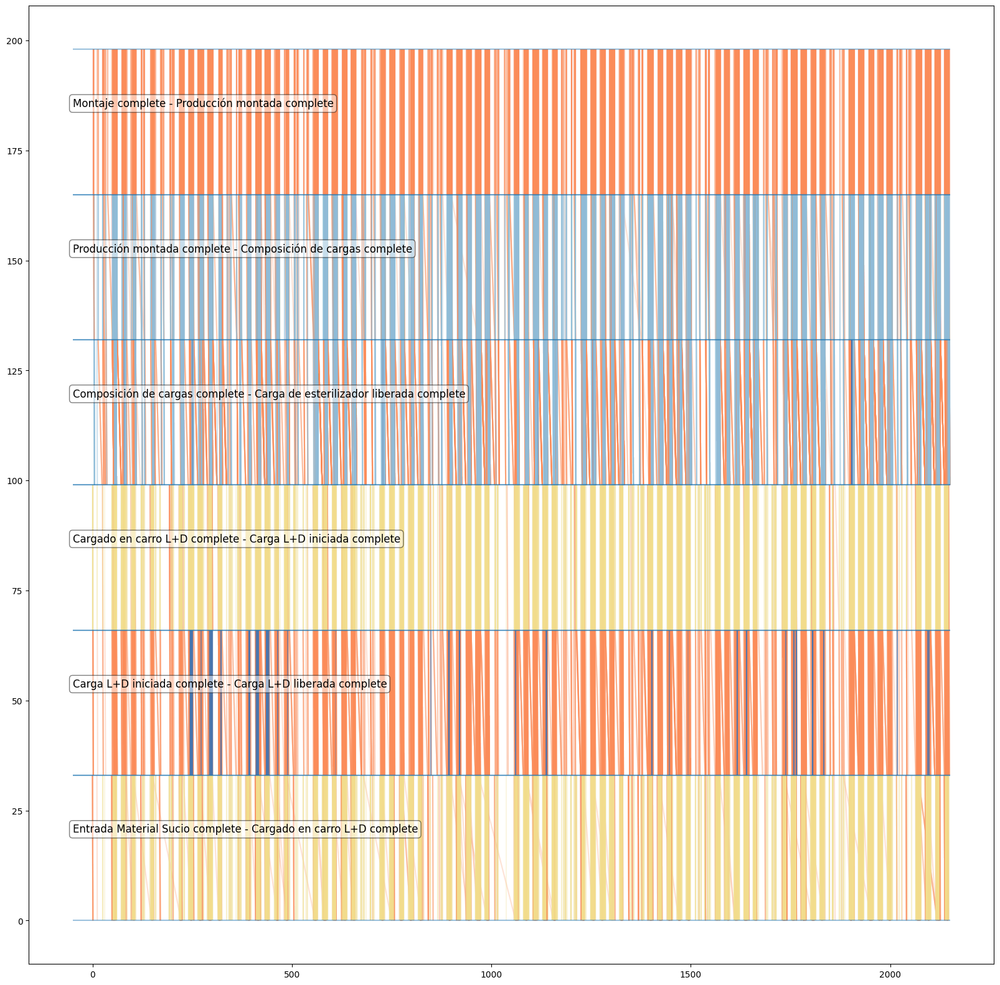

In [176]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

#### Visualize data based on the staring activity

In [177]:
# reload our earlier event data
rf = Performance_Spectrum.load_log('company_data')

In [178]:
import re
# get the 6 most frequent segments
segments = list(rf.segment_counts().keys())
# but filter out any "Appeal"-related activities, i.e., the events are removed from the data
# the segments in the performance spectrum then "jump over" all "Appeal"-related activities

segments_entrada_material_sucio = [s for s in segments if "Entrada Material Sucio complete -" in s]
segments_cargado_en_carro_ld = [s for s in segments if "Cargado en carro L+D complete -" in s]
segments_carga_ld_iniciada = [s for s in segments if "Carga L+D iniciada complete -" in s]
segments_carga_ld_liberada = [s for s in segments if "Carga L+D liberada complete -" in s]
segments_montaje = [s for s in segments if "Montaje complete -" in s]
segments_produccion_montada = [s for s in segments if "Producción montada complete -" in s]
segments_composición_de_cargas = [s for s in segments if "Composición de cargas complete -" in s]
segments_carga_de_esterilizador_liberada = [s for s in segments if "Carga de esterilizador liberada complete -" in s]
segments_comisionado = [s for s in segments if "Comisionado complete -" in s]



##### 1- Starting with Entrada Material Sucio

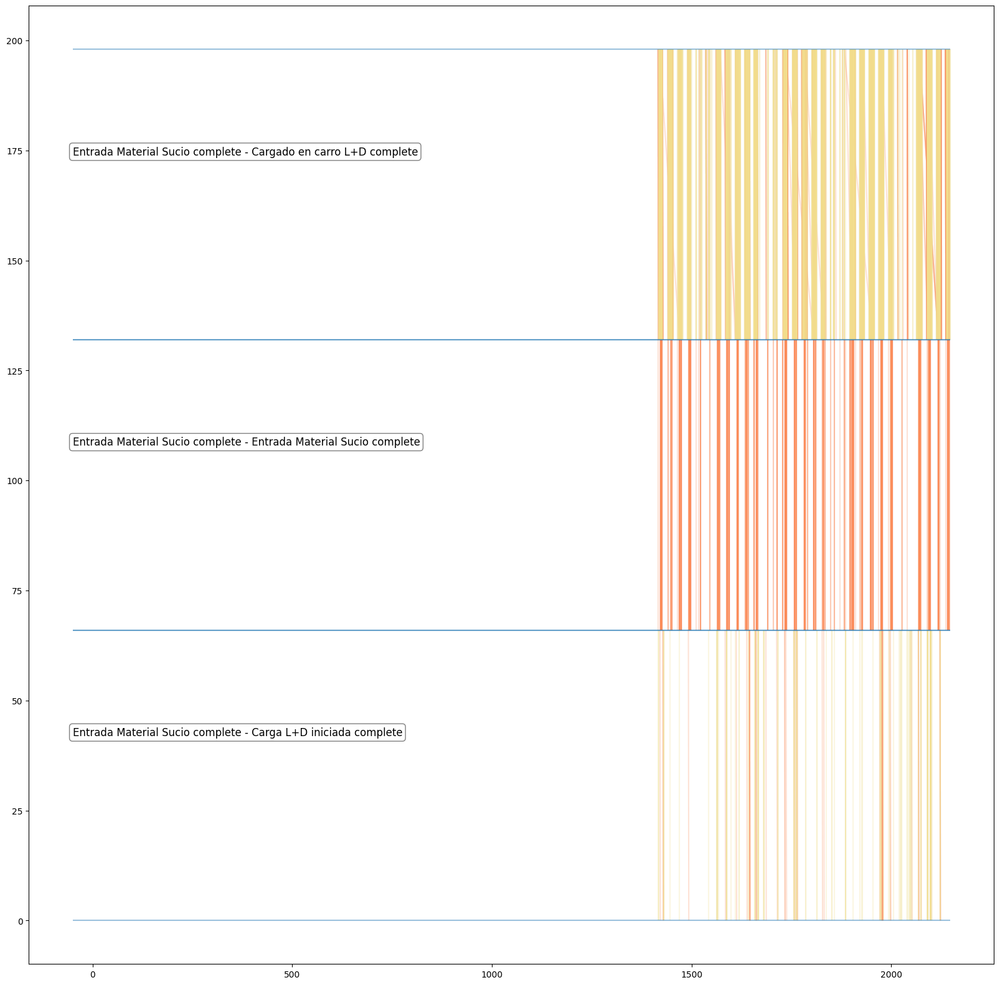

In [179]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_entrada_material_sucio, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 2- Starting with Cargado en carro L+D

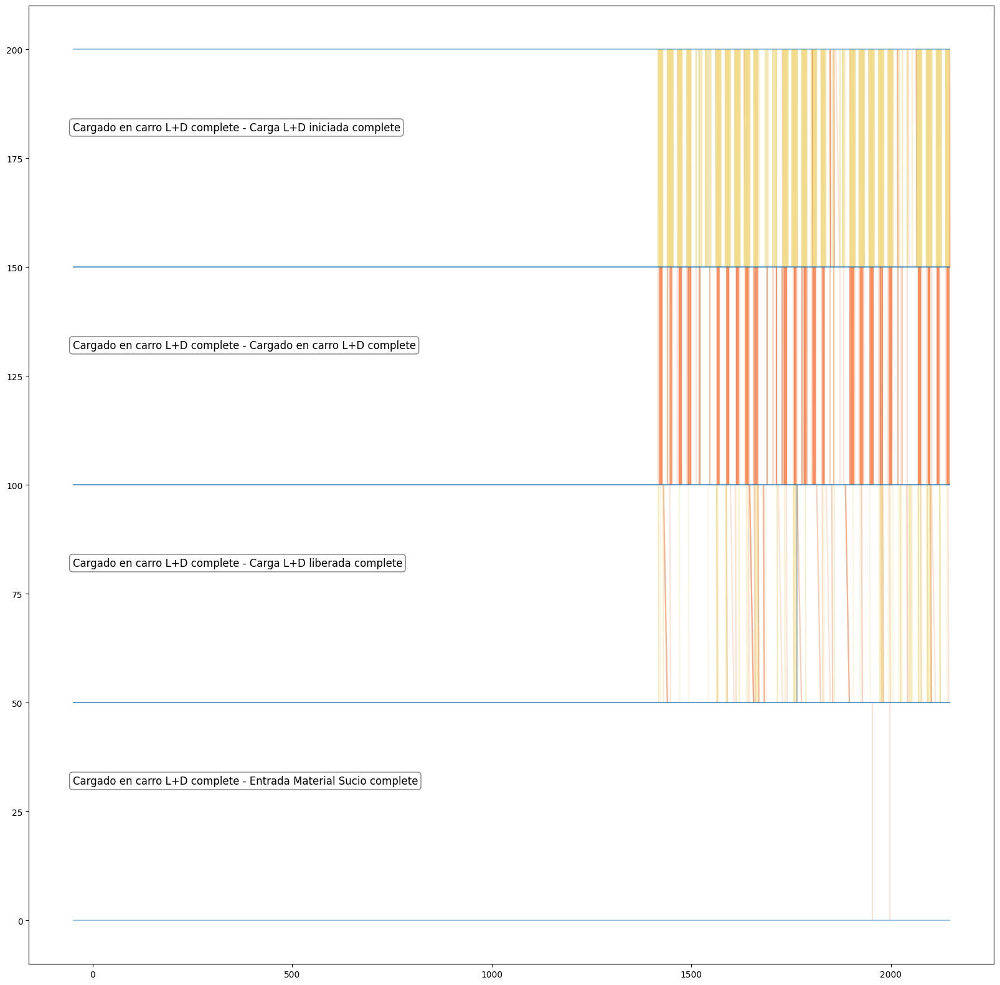

In [180]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_cargado_en_carro_ld, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 3- Starting with Carga L+D iniciada

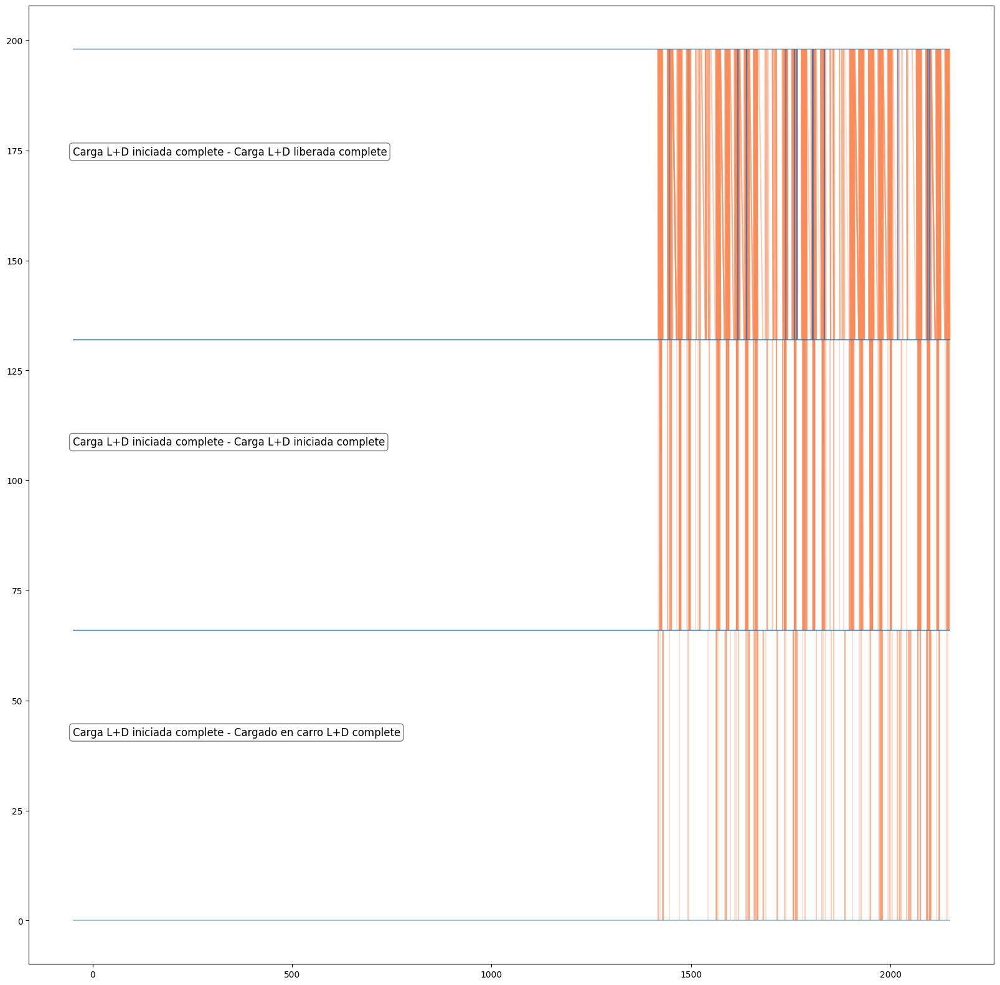

In [181]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_carga_ld_iniciada, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 4- Starting with Carga L+D liberada

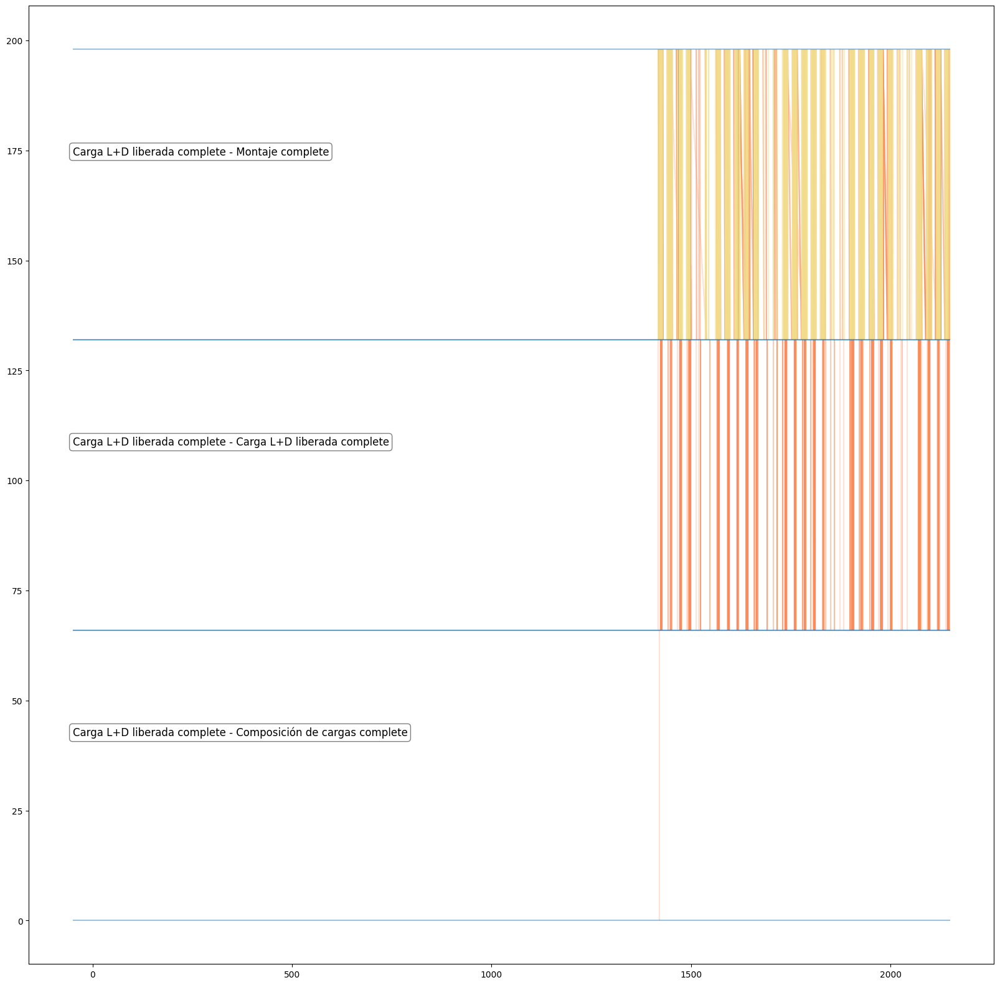

In [182]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_carga_ld_liberada, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 5- Starting with Montaje

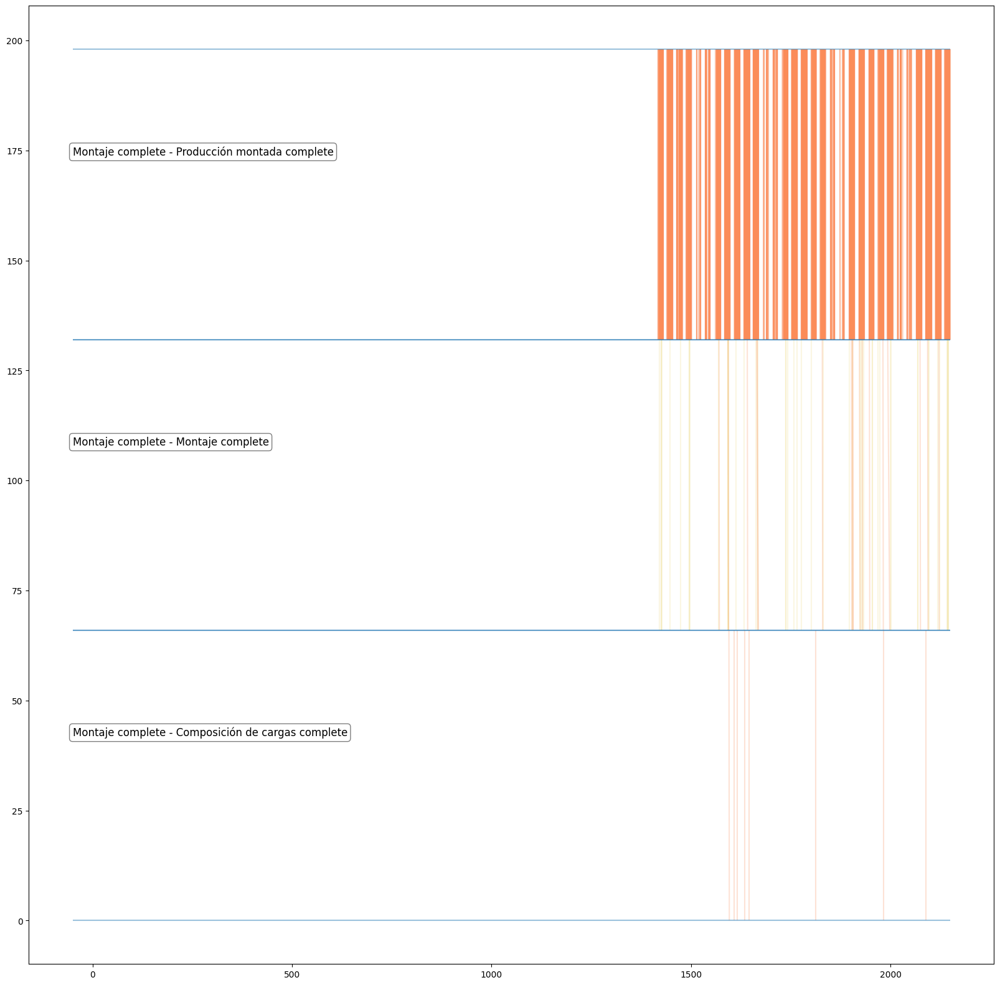

In [183]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_montaje, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 6- Starting with Producción montada

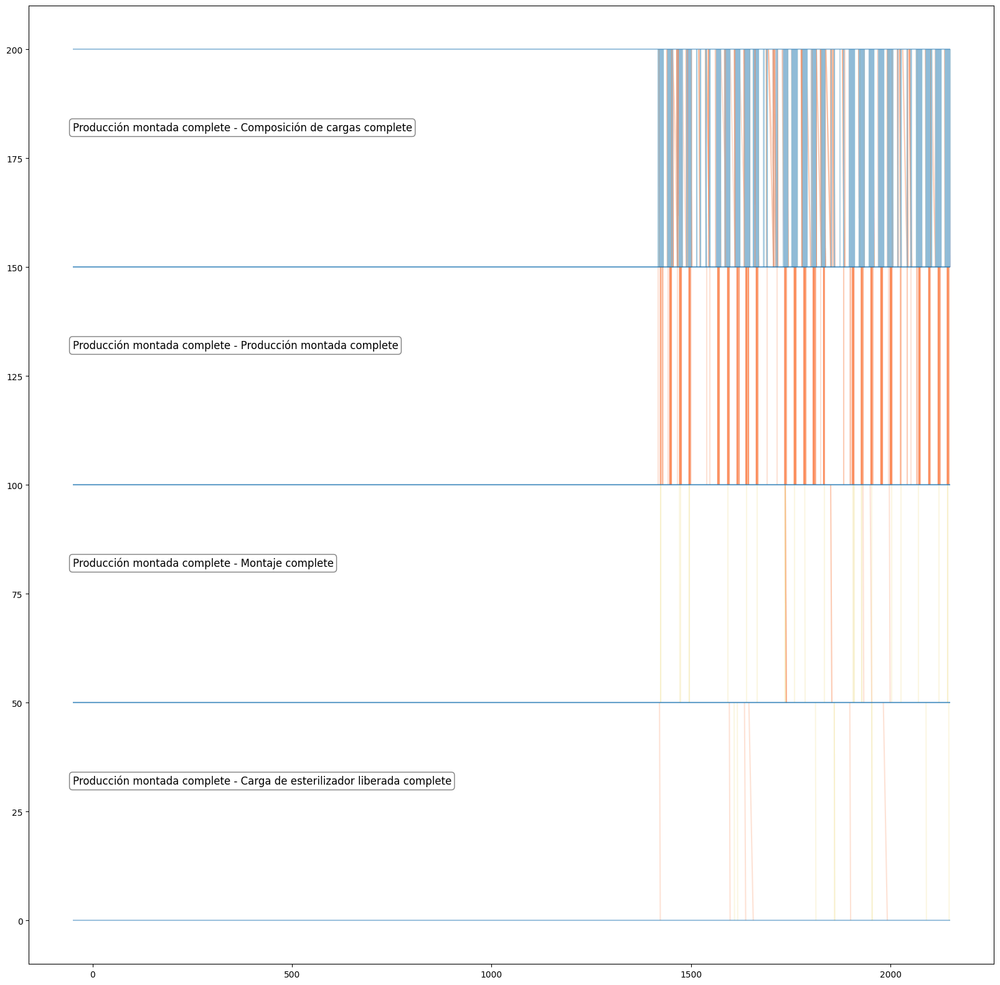

In [184]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_produccion_montada, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 7- Starting with Composición de cargas

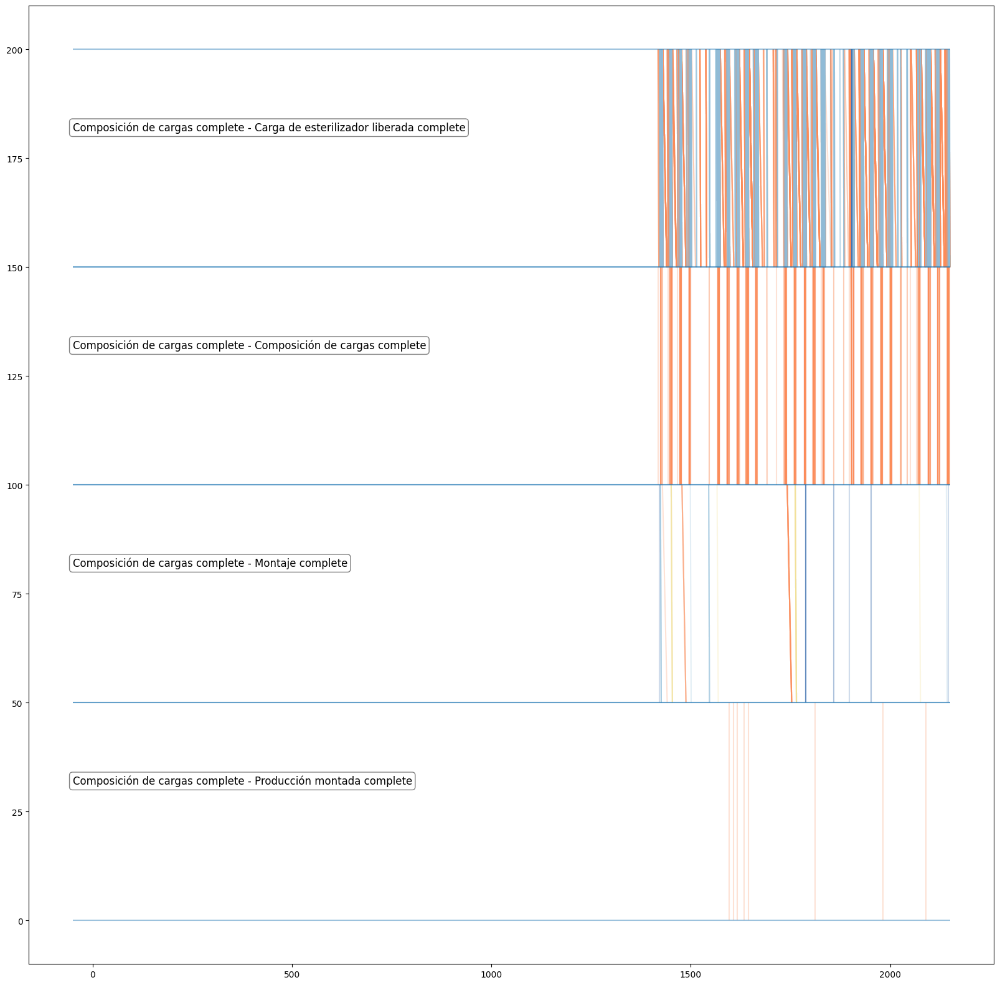

In [185]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_composición_de_cargas, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 8- Starting with Carga de esterilizador liberada

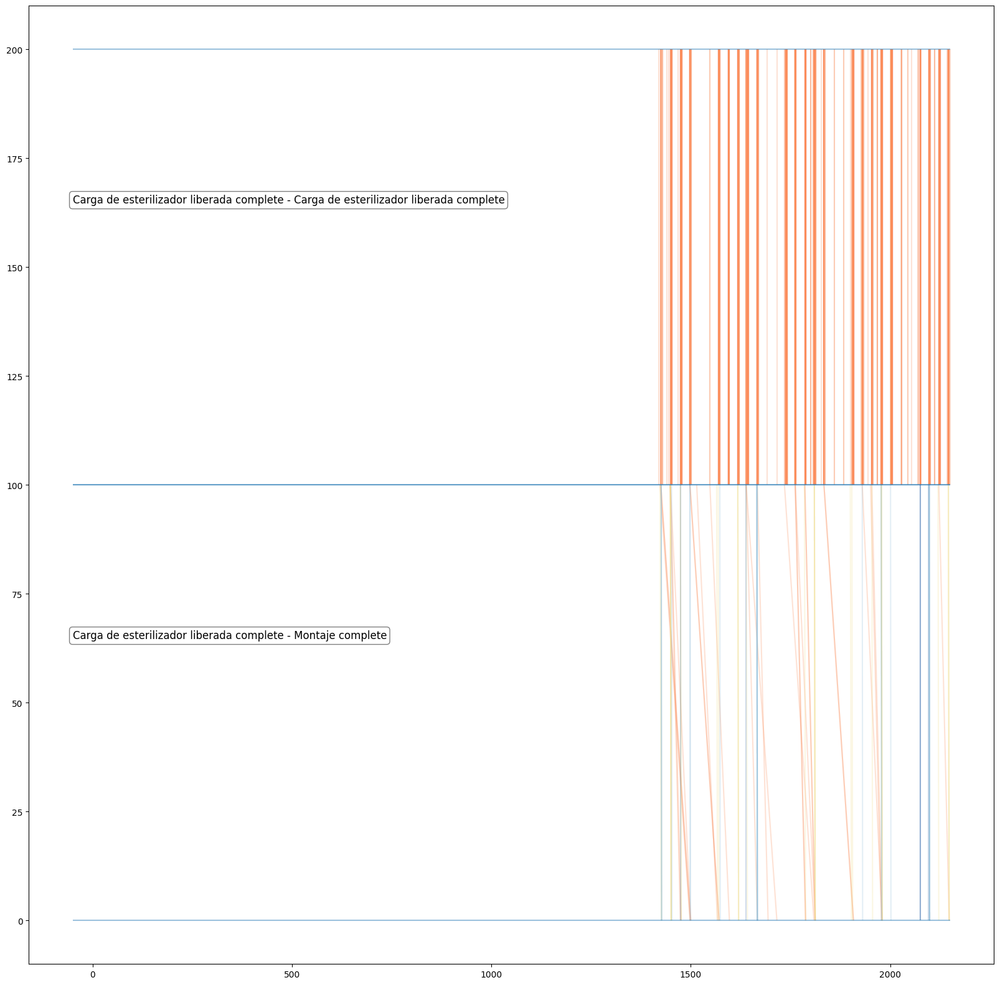

In [186]:
# compute the performance spectrum visualization
vis_rf = Performance_Spectrum.Spectrum(segments_carga_de_esterilizador_liberada, rf.pf)
# define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
# for performance-based classes, length of list defines number of quantiles
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
# create plot
fig, ax = plt.subplots(figsize=[20,20])
# and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

##### 9- Starting with Comisionado

In [187]:
## compute the performance spectrum visualization
#vis_rf = Performance_Spectrum.Spectrum(segments_comisionado, rf.pf)
## define colors for class-based coloring of lines as list of RGB values: (R/256,G/256/B256)
## for performance-based classes, length of list defines number of quantiles
#class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
#                (252/256, 141/256,89/256)]
## create plot
#fig, ax = plt.subplots(figsize=[20,20])
## and visualize, classifier is histogram over 'duration' attribute into equi-distance quantiles based on `class_colors`
#vis_rf.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_rf.classify_hist, metric='duration', args=[4])

### Infer Missing Start Times and Analyze Service Times
#### This Spectrum shows the estimated start for each activity and the difference between its starting and finishing time

In [188]:
pf_inferred = rf.infer_start_times()
segments = pf_inferred['segment_name'].unique()
vis_inferred = Performance_Spectrum.Spectrum(segments, pf_inferred)

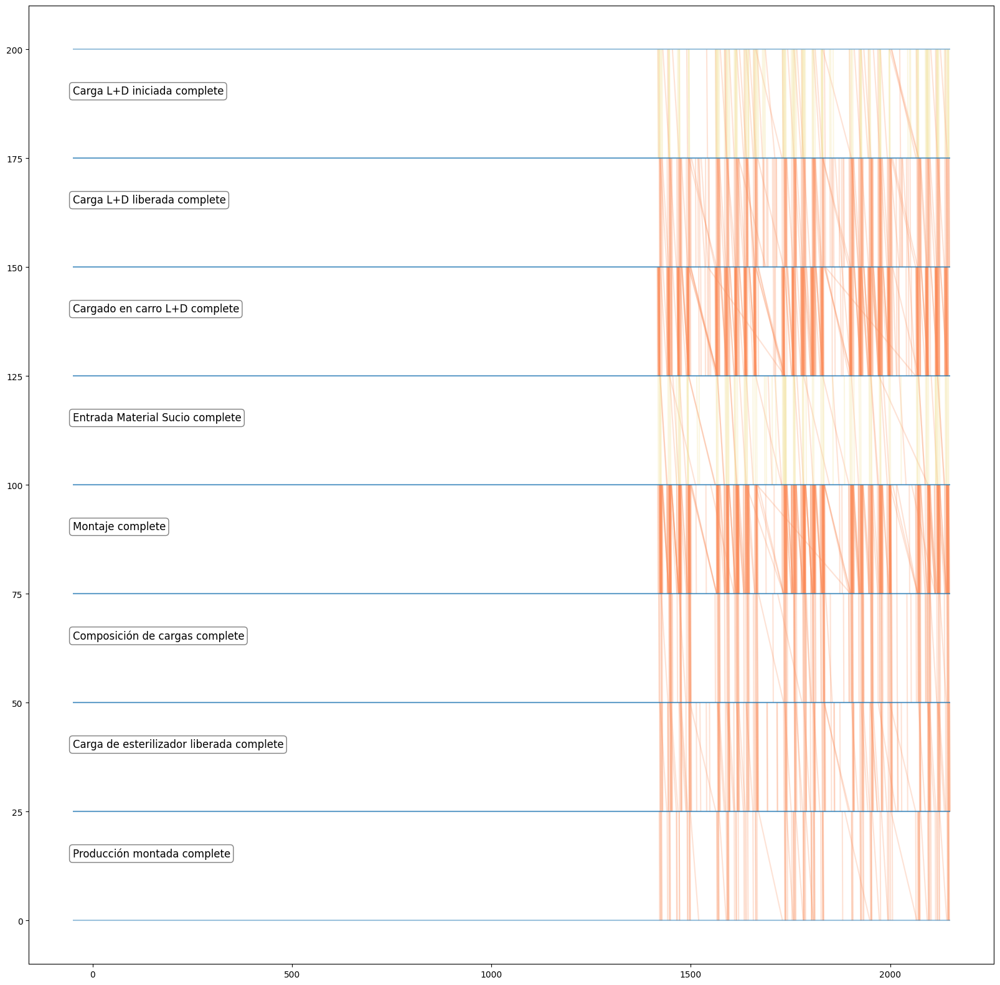

In [189]:
class_colors = [(69/256, 117/256, 180/256), (145/256, 191/256, 219/256), (243/256, 224/256, 144/256),
                (252/256, 141/256,89/256)]
fig, ax = plt.subplots(figsize=[20,20])
vis_inferred.plot_performance_spectrum(class_colors, ax, label_offset=-50, classifier=vis_inferred.classify_hist, metric='duration', args=[4])

In [190]:
query = f'''match p = (e1:Event {{Activity:"Entrada Material Sucio"}}) - [:DF_CASE] -> 
(e2:Event {{Activity:"Cargado en carro L+D"}}) - [:DF_CASE] -> (e3:Event {{Activity:"Carga L+D iniciada"}})
 - [:DF_CASE] -> (e4:Event {{Activity:"Carga L+D liberada"}}) - [:DF_CASE] -> 
 (e5:Event {{Activity:"Montaje"}}) - [:DF_CASE] -> (e6:Event {{Activity:"Producción montada"}})
   - [:DF_CASE] -> (e7:Event {{Activity:"Composición de cargas"}}) - [:DF_CASE] -> 
   (e8:Event {{Activity:"Carga de esterilizador liberada"}}) 
return e8.CaseID, e3.Activity, e3.timestamp, e4.Activity, e4.timestamp, e5.Activity, e5.timestamp, e6.Activity, e6.timestamp, e7.Activity, e7.timestamp, e8.Activity, e8.timestamp
order by e3.timestamp, e4.timestamp, e5.timestamp, e6.timestamp'''
result = session.run(query)
records = [record.values() for record in result]
columns = result.keys()
df = pd.DataFrame(records, columns=columns)
df['e3.timestamp'] = pd.to_datetime(df['e3.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df['e4.timestamp'] = pd.to_datetime(df['e4.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df['e5.timestamp'] = pd.to_datetime(df['e5.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df['e6.timestamp'] = pd.to_datetime(df['e6.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df['e7.timestamp'] = pd.to_datetime(df['e7.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df['e8.timestamp'] = pd.to_datetime(df['e8.timestamp'], format='%Y-%m-%dT%H:%M:%S.%f%z')
df.head()

,e8.CaseID,e3.Activity,e3.timestamp,e4.Activity,e4.timestamp,e5.Activity,e5.timestamp,e6.Activity,e6.timestamp,e7.Activity,e7.timestamp,e8.Activity,e8.timestamp
0,HNB-GIN.015-9-CN7,Carga L+D iniciada,2022-01-01 08:29:00+00:00,Carga L+D liberada,2022-01-01 09:41:00+00:00,Montaje,2022-01-01 10:03:00+00:00,Producción montada,2022-01-01 10:05:00+00:00,Composición de cargas,2022-01-01 10:55:00+00:00,Carga de esterilizador liberada,2022-01-01 12:27:00+00:00
1,HNB-GIN.014-21-CN10,Carga L+D iniciada,2022-01-01 08:29:00+00:00,Carga L+D liberada,2022-01-01 09:41:00+00:00,Montaje,2022-01-01 10:11:00+00:00,Producción montada,2022-01-01 10:18:00+00:00,Composición de cargas,2022-01-01 10:55:00+00:00,Carga de esterilizador liberada,2022-01-01 12:27:00+00:00
2,HUBU-URG.005-8-CN3,Carga L+D iniciada,2022-01-01 08:29:00+00:00,Carga L+D liberada,2022-01-01 09:41:00+00:00,Montaje,2022-01-01 10:24:00+00:00,Producción montada,2022-01-01 10:30:00+00:00,Composición de cargas,2022-01-01 10:56:00+00:00,Carga de esterilizador liberada,2022-01-01 12:27:00+00:00
3,HUBU-URG.005-3-CN4,Carga L+D iniciada,2022-01-01 08:29:00+00:00,Carga L+D liberada,2022-01-01 09:41:00+00:00,Montaje,2022-01-01 10:37:00+00:00,Producción montada,2022-01-01 10:38:00+00:00,Composición de cargas,2022-01-01 10:56:00+00:00,Carga de esterilizador liberada,2022-01-01 12:27:00+00:00
4,HUBU-URG.BH111R-0-CN16,Carga L+D iniciada,2022-01-01 08:29:00+00:00,Carga L+D liberada,2022-01-01 09:41:00+00:00,Montaje,2022-01-01 10:44:00+00:00,Producción montada,2022-01-01 10:44:00+00:00,Composición de cargas,2022-01-01 10:56:00+00:00,Carga de esterilizador liberada,2022-01-01 12:27:00+00:00


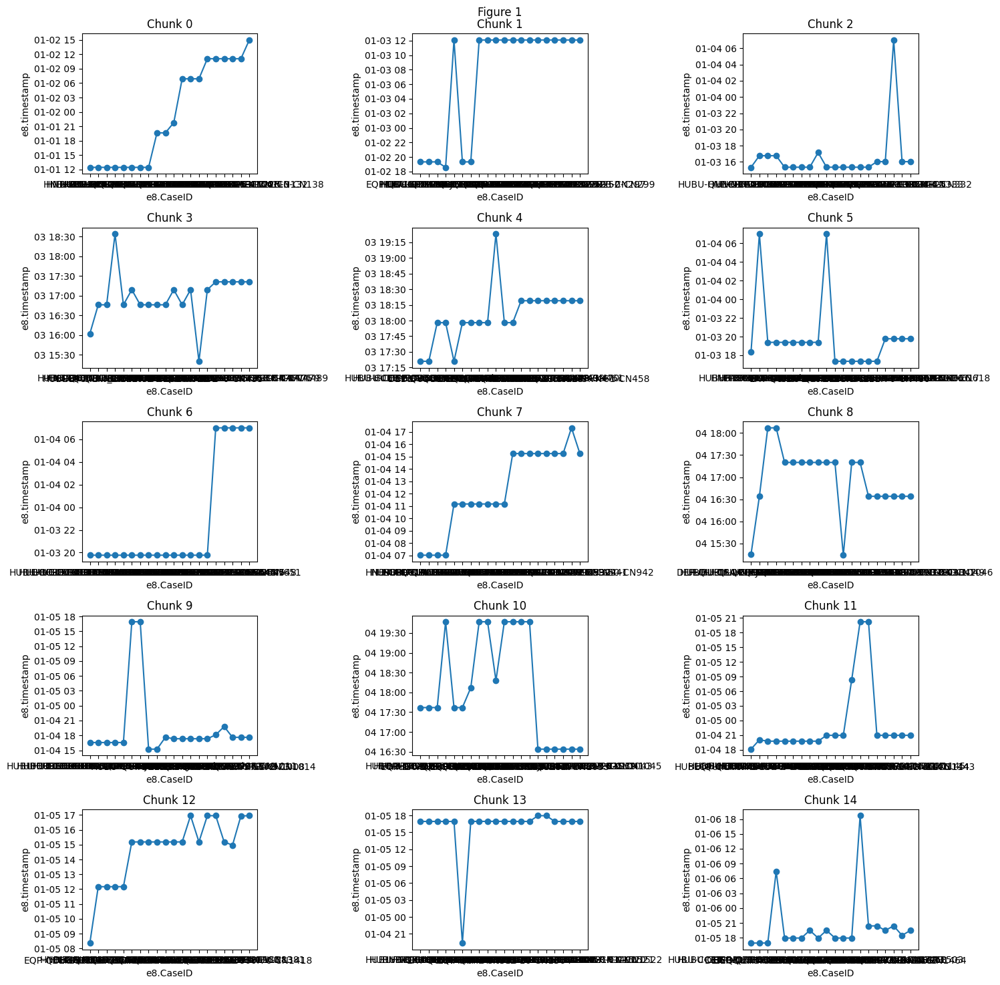

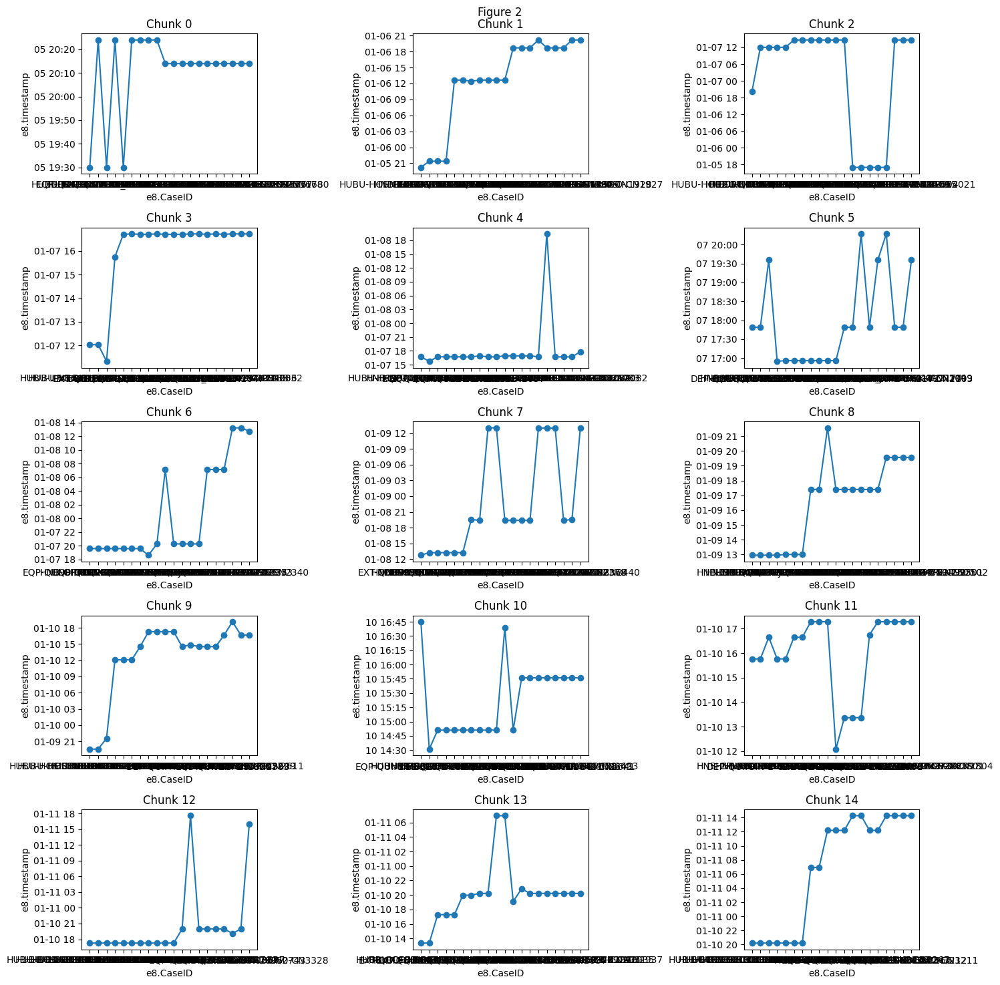

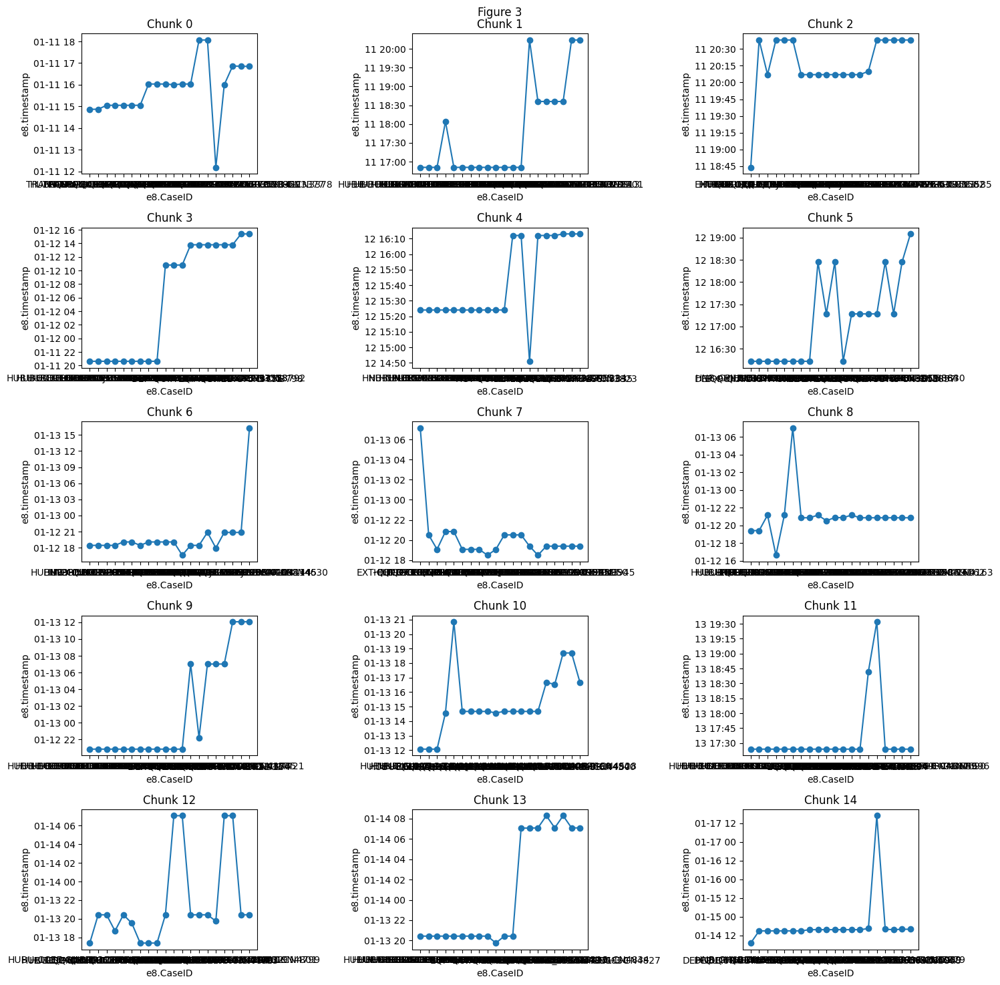

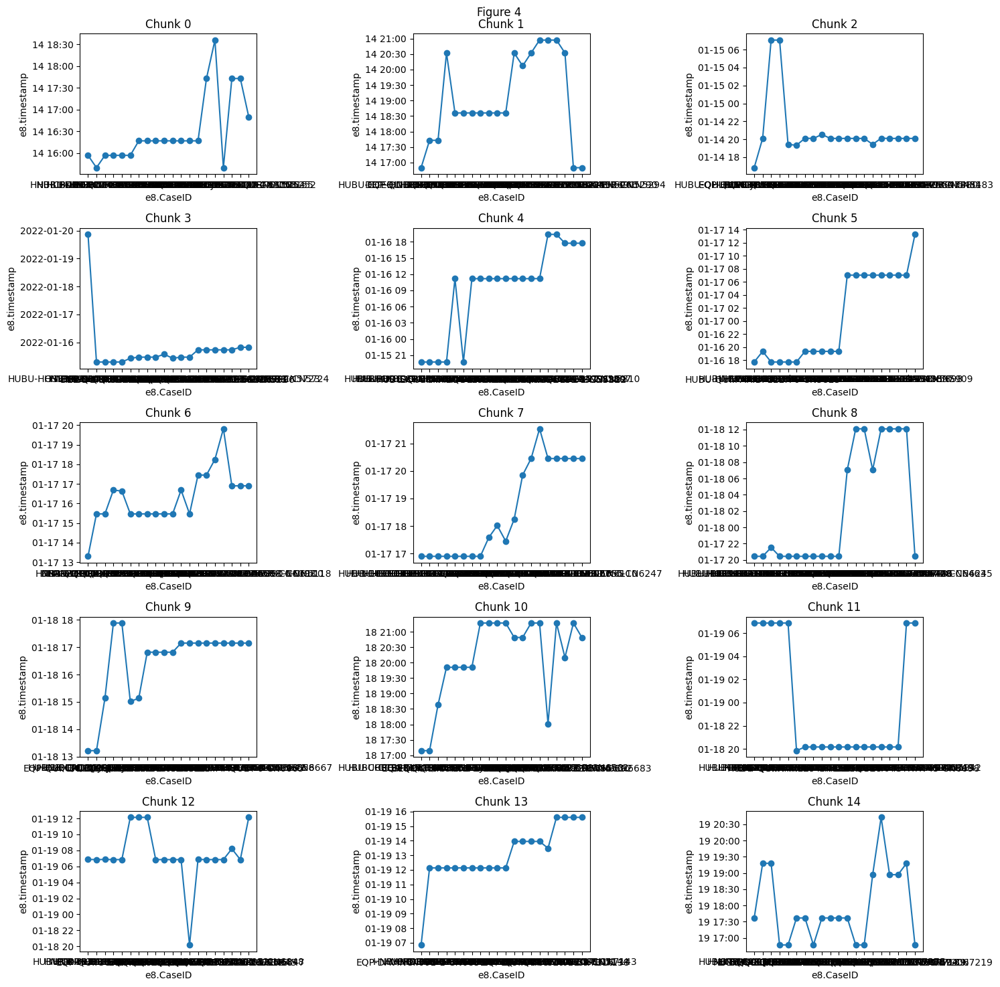

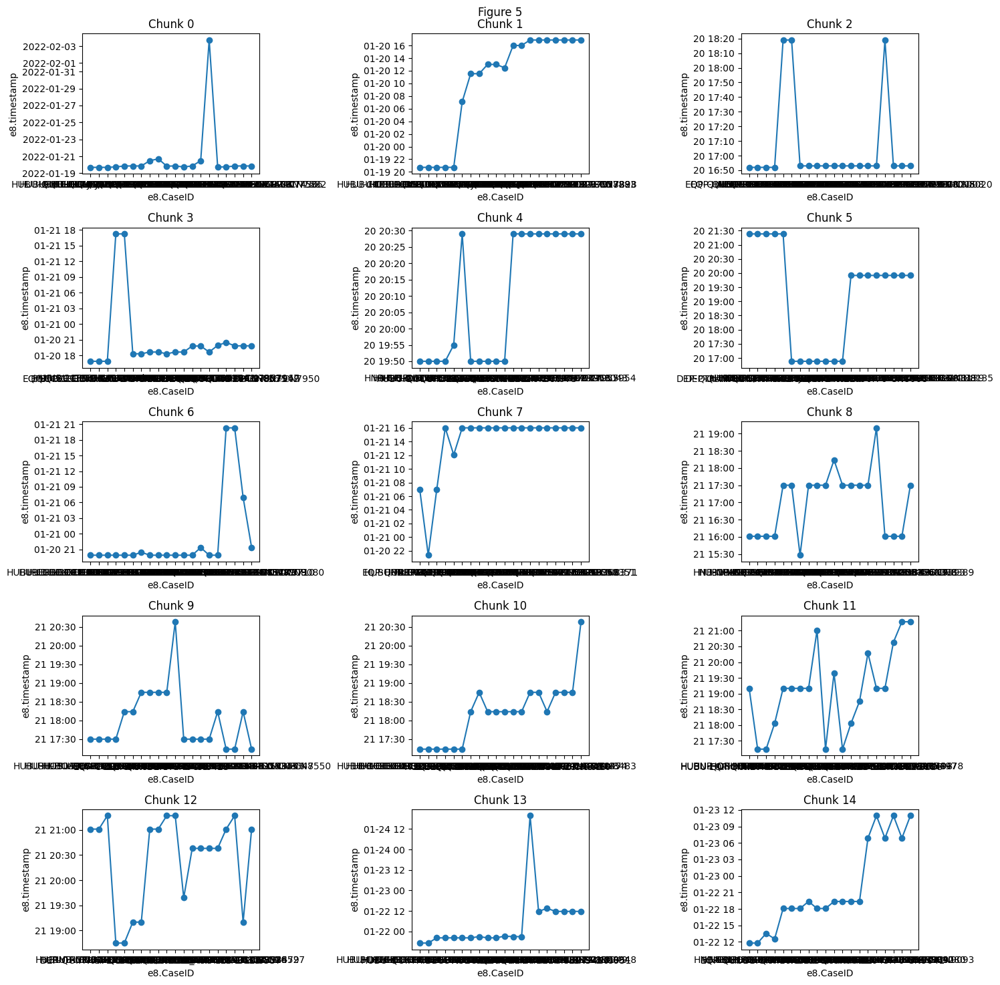

...

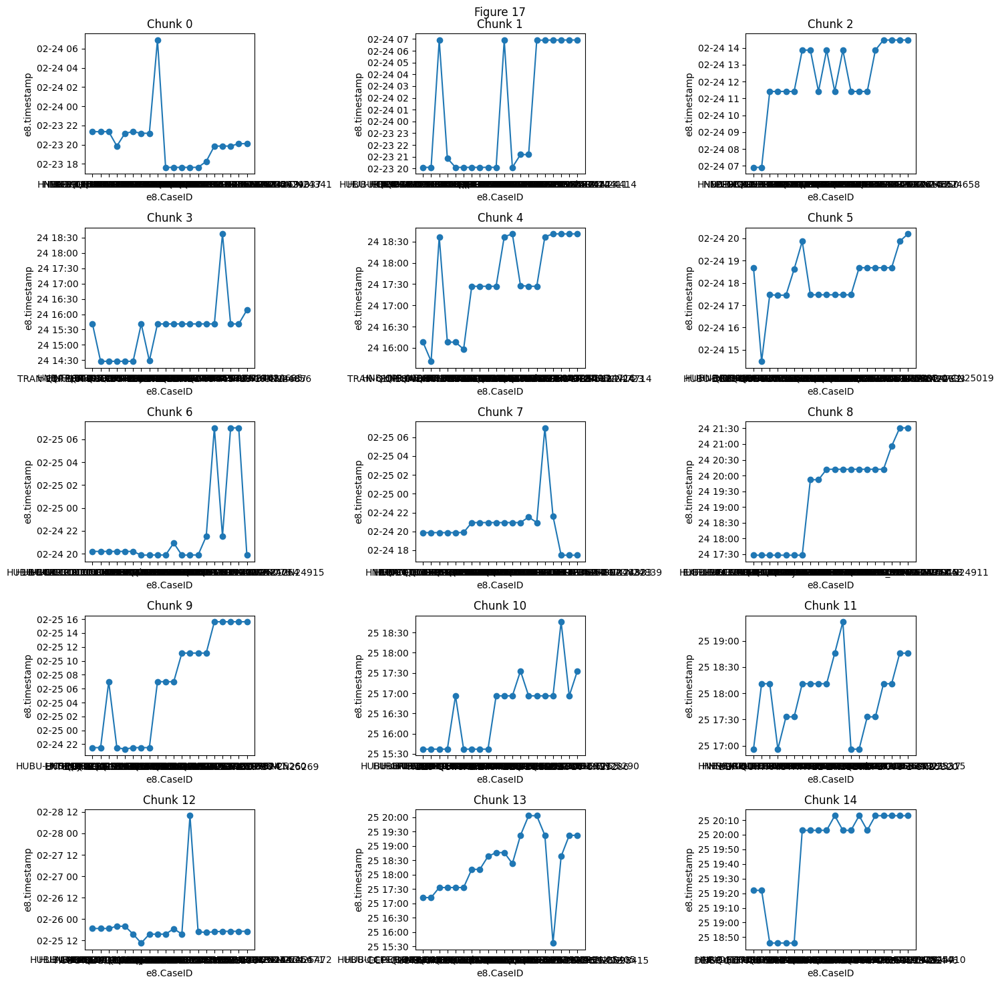

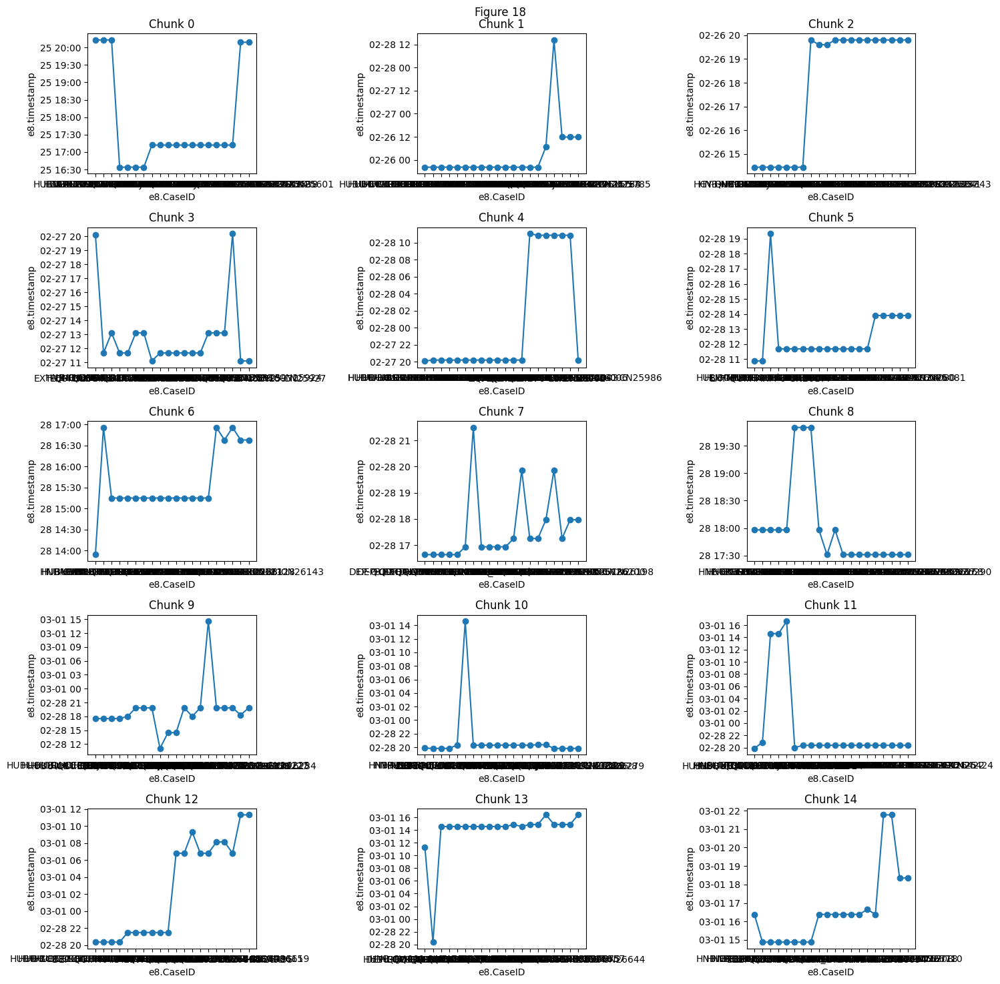

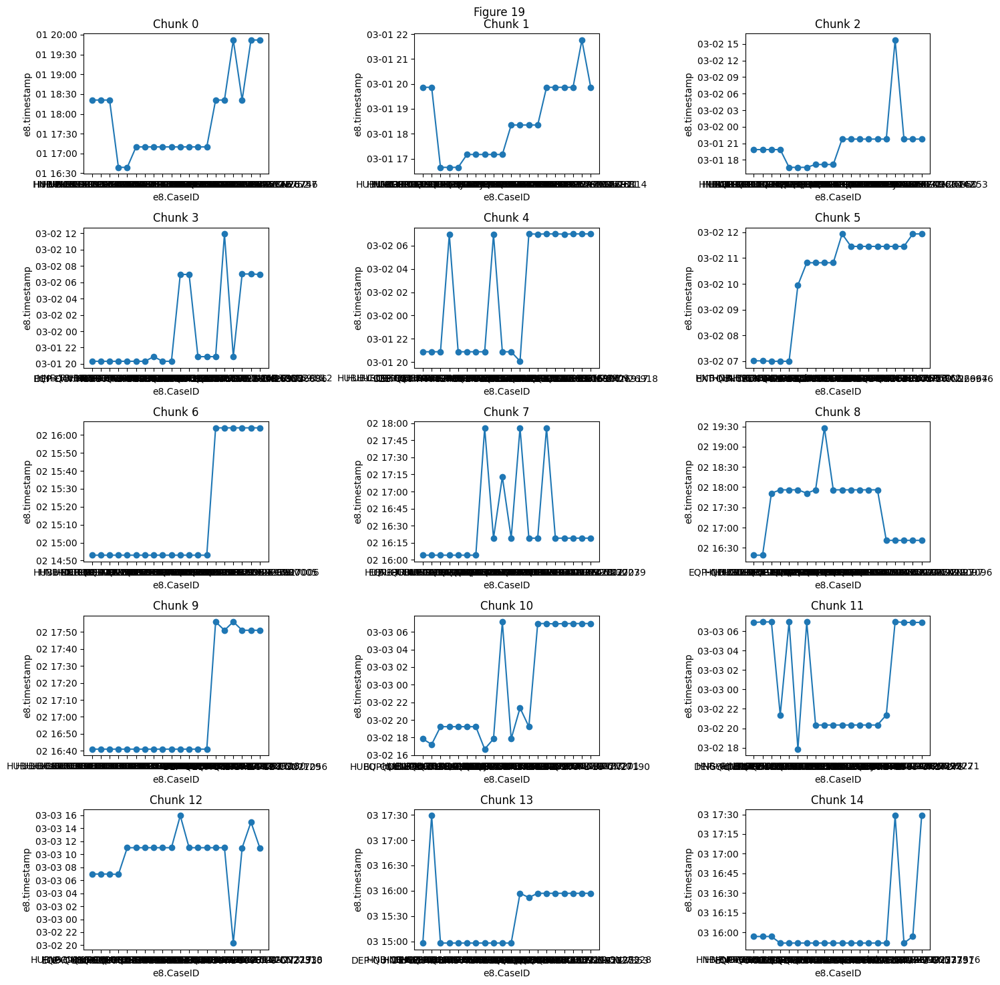

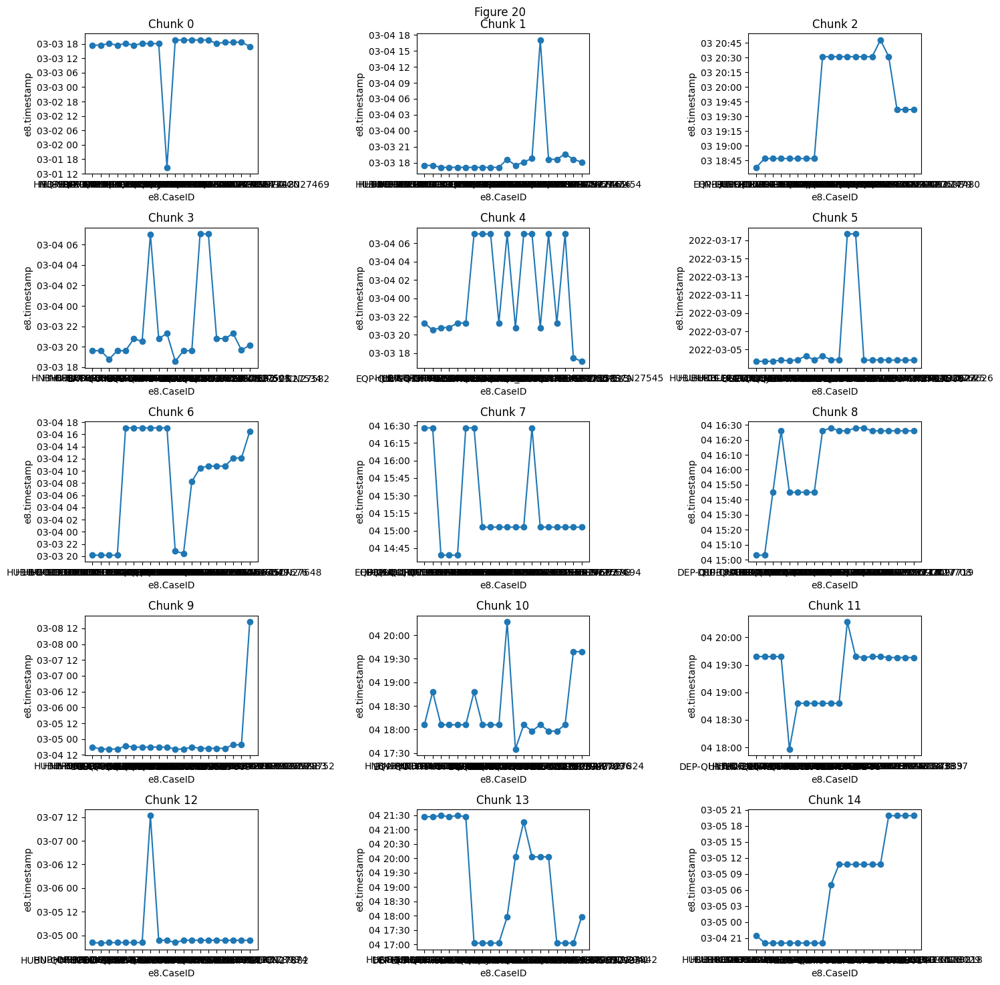

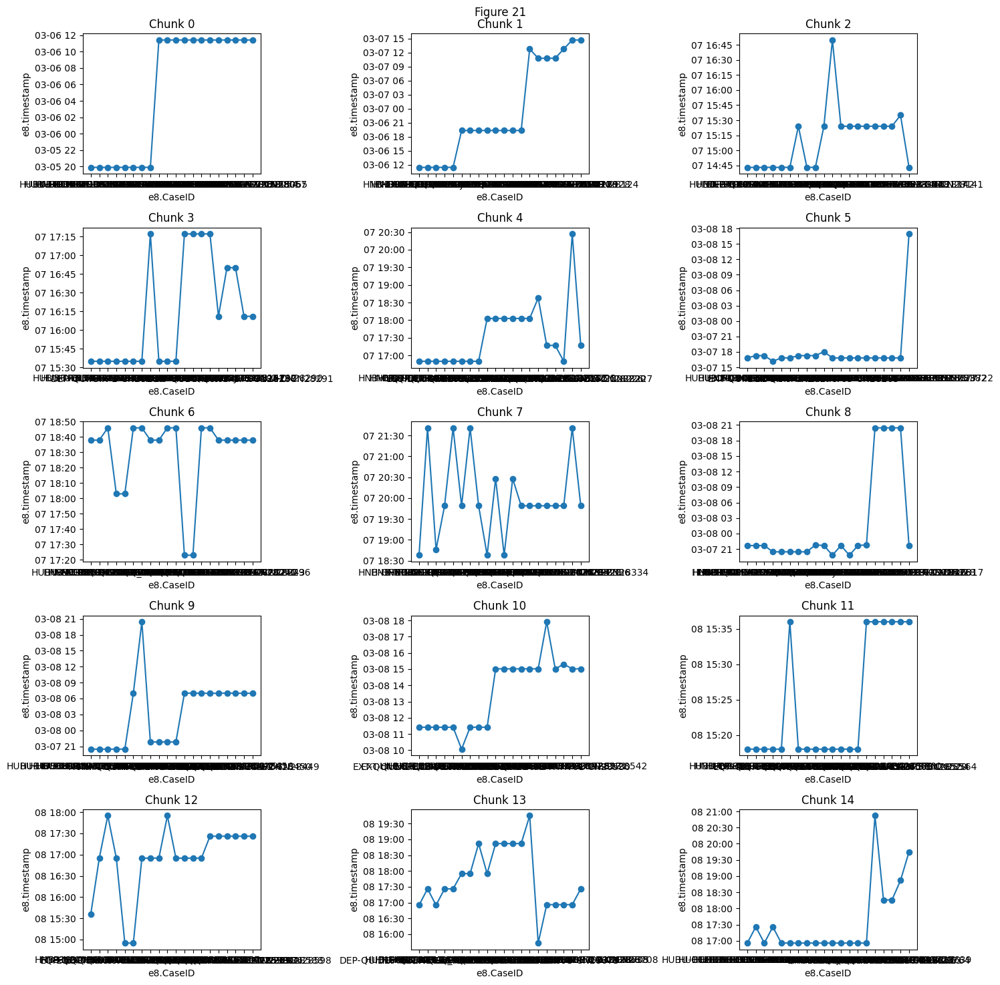

In [191]:
chunk_size = 20
num_chunks = (len(df) + chunk_size - 1) // ((chunk_size+1) * 15)
last_chunk = 0

for chunk_index in range(num_chunks):

    fig, axs = plt.subplots(5, 3, figsize=(15, 15))
    fig.suptitle(f'Figure {chunk_index + 1}')

    for i, ax in enumerate(axs.flat):

        start_idx = last_chunk 
        end_idx = min(start_idx + chunk_size, len(df))

        ax.plot(df['e8.CaseID'].iloc[start_idx:end_idx], df['e8.timestamp'].iloc[start_idx:end_idx], marker='o')
        ax.set_xlabel('e8.CaseID')
        ax.set_ylabel('e8.timestamp')
        ax.set_title(f'Chunk {i}')
        last_chunk = end_idx + 1

    plt.tight_layout()
    plt.show()